We want to use image embeddings from ResNeXt for both EDA and classification. So let's introduce some code that will do that.

In [1]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np


DEVICE = torch.device('cpu')
OUTPUT_SIZE = 2048

model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V2)

extraction_layer = model._modules.get('avgpool')
model.to(DEVICE)
model.eval()

scaler = transforms.Resize((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

def get_vec(arg, model, extraction_layer):
    image = normalize(to_tensor(scaler(arg))).unsqueeze(0).to(DEVICE)
    result = torch.zeros(1, OUTPUT_SIZE, 1, 1)
    def copy_data(m, i, o):
        result.copy_(o.data)
    hooked = extraction_layer.register_forward_hook(copy_data)
    with torch.no_grad():
        model(image)
    hooked.remove()
    return result

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth
100%|██████████| 95.8M/95.8M [00:00<00:00, 171MB/s]


Let's load up our data, including image embeddings and thumbnails. We don't have a lot of data, so we're going to load it all up. And we're going to combine the validation data and training data.

In [2]:
import arrow
import base64
import pandas as pd
from glob import iglob
from io import BytesIO
from os.path import basename
from PIL import Image

ROOT = '/kaggle/input/eye-detection-dataset/Dataset/'
STOP = 2000
TEST = ROOT + 'test/'
THUMBNAIL_SIZE = (64, 64)
TRAIN = ROOT + 'train/'
VALID = ROOT + 'val/'


def embed(model, filename: str):
    with Image.open(fp=filename, mode='r') as image:
        return get_vec(arg=image.convert('RGB'), model=model, extraction_layer=extraction_layer).numpy().reshape(OUTPUT_SIZE,)


# https://stackoverflow.com/a/952952
def flatten(arg):
    return [x for xs in arg for x in xs]

def png(filename: str) -> str:
    with Image.open(fp=filename, mode='r') as image:
        buffer = BytesIO()
        # our images are pretty big; let's shrink the hover images to thumbnail size
        image.resize(size=THUMBNAIL_SIZE).convert('RGB').save(buffer, format='png')
        return 'data:image/png;base64,' + base64.b64encode(buffer.getvalue()).decode()

def label(filename: str) -> str:
    pieces = filename.split('.')
    filename = '.'.join(pieces[:-1]) + '.txt'
    pieces = filename.split('/')
    pieces = [piece if piece != 'images' else 'labels' for piece in pieces]
    filename = '/'.join(pieces)
    try:
        with open(file=filename, mode='r') as fp:
            return fp.readlines()[0].split(' ')[0]
    except:
        return -1
    

def get_picture_from_glob(arg: str, stop: int) -> list:
    time_get = arrow.now()
    result = [pd.Series(data=[basename(input_file), embed(model=model, filename=input_file), png(filename=input_file), label(filename=input_file)], 
                        index=['name', 'value', 'png', 'label'])
        for index, input_file in enumerate(iglob(pathname=arg)) if index < stop and input_file.endswith('.jpg')]
    print('encoded {} rows in {}'.format(len(result), arrow.now() - time_get))
    return result

time_start = arrow.now()
train_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TRAIN + '/*')}
train_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, stop=STOP) for key, value in train_dict.items()]))
valid_dict = {basename(folder) : folder + '/*.*' for folder in iglob(VALID + '/*')}
valid_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, stop=STOP) for key, value in valid_dict.items()]))
train_df = pd.concat(axis='index', objs=[train_df, valid_df])
train_df = train_df[train_df['label'] != -1]
test_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TEST + '/*')}
test_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, stop=STOP) for key, value in test_dict.items()]))
test_df = test_df[test_df['label'] != -1]
print('done in {}'.format(arrow.now() - time_start))

encoded 0 rows in 0:00:00.115048
encoded 0 rows in 0:00:00.001208
encoded 1385 rows in 0:03:59.702536
encoded 0 rows in 0:00:00.069140
encoded 0 rows in 0:00:00.000839
encoded 396 rows in 0:01:10.409758
encoded 0 rows in 0:00:00.042213
encoded 0 rows in 0:00:00.001015
encoded 198 rows in 0:00:33.429715
done in 0:05:43.955602


Is the target class balanced?

In [3]:
train_df['label'].value_counts(normalize=True).to_frame().sort_index().T

label,0,1
proportion,0.868052,0.131948


In [4]:
test_df['label'].value_counts(normalize=True).to_frame().sort_index().T

label,0,1
proportion,0.853535,0.146465


Our data is not balanced; and it is a surprise that we only have two classes. Fortunately our training data and our test data are in roughly equal proportions.

Let's use TSNE to get x/y coordinates from our image embeddings.

In [5]:
import arrow
from sklearn.manifold import TSNE

time_start = arrow.now()
train_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
train_df[['x', 'y']] = train_reducer.fit_transform(X=train_df['value'].apply(func=pd.Series))
print('done with TSNE in {}'.format(arrow.now() - time_start))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1781 samples in 0.016s...
[t-SNE] Computed neighbors for 1781 samples in 0.399s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1781
[t-SNE] Computed conditional probabilities for sample 1781 / 1781
[t-SNE] Mean sigma: 3.064823
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.503784
[t-SNE] KL divergence after 1000 iterations: 1.270656
done with TSNE in 0:00:11.039868


We're ready to plot.

In [6]:
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool

from bokeh.plotting import figure
from bokeh.plotting import output_notebook
from bokeh.plotting import show
from bokeh.palettes import Turbo256
from bokeh.transform import factor_cmap

output_notebook()

datasource = ColumnDataSource(train_df[['png', 'label', 'x', 'y']])
factor_count = max(train_df['label'].nunique(), 3)
indices = np.linspace(0, len(Turbo256)-1, factor_count, dtype=int)
palette = [Turbo256[index] for index in indices]
mapper = factor_cmap(field_name = 'label', palette=palette, factors=train_df['label'].unique().tolist(), start=0, end=factor_count-1, )

plot_figure = figure(title='TSNE projection: search and rescue', width=1000, height=800, tools=('pan, wheel_zoom, reset'))

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@png' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 18px'>@label</span>
    </div>
</div>
"""))

plot_figure.scatter(x='x', y='y', source=datasource, line_alpha=0.6, fill_alpha=0.6, size=7, color=mapper)
show(plot_figure)

Loading BokehJS ...

What do we see? We see that our labels appear to be 1 = blue and 0 = not blue; interestingly, TSNE seems to find a cluster with eyebrows (upper left) and without (lower middle) and it mostly clusters the blue eyes with the cloudy eyes. But fortunately for us, any given blue eye image seems to have mostly neighbors from the blue eye class. This suggests that a model may perform well. Let's build a model and find out.

In [7]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

logreg = LogisticRegression(max_iter=2000, tol=1e-12).fit(train_df['value'].apply(pd.Series), train_df['label'])
print('model fit in {} iterations'.format(logreg.n_iter_[0]))
print('accuracy: {:5.4f}'.format(accuracy_score(y_true=test_df['label'], y_pred=logreg.predict(X=test_df['value'].apply(pd.Series)))))
print('f1: {:5.4f}'.format(f1_score(average='weighted', y_true=test_df['label'], y_pred=logreg.predict(X=test_df['value'].apply(pd.Series)))))
print(classification_report(y_true=test_df['label'], y_pred=logreg.predict(X=test_df['value'].apply(pd.Series)), zero_division=0))

model fit in 210 iterations
accuracy: 0.9646
f1: 0.9632
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       169
           1       0.96      0.79      0.87        29

    accuracy                           0.96       198
   macro avg       0.96      0.89      0.92       198
weighted avg       0.96      0.96      0.96       198



An f1 > 0.96 isn't bad for so little effort. Let's look at our model probabilities. We'll need to build another TSNE, so our scatter plot will look different.

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 198 samples in 0.002s...
[t-SNE] Computed neighbors for 198 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 198 / 198
[t-SNE] Mean sigma: 4.077083
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.422844
[t-SNE] KL divergence after 1000 iterations: 0.585878


<Axes: xlabel='x', ylabel='y'>

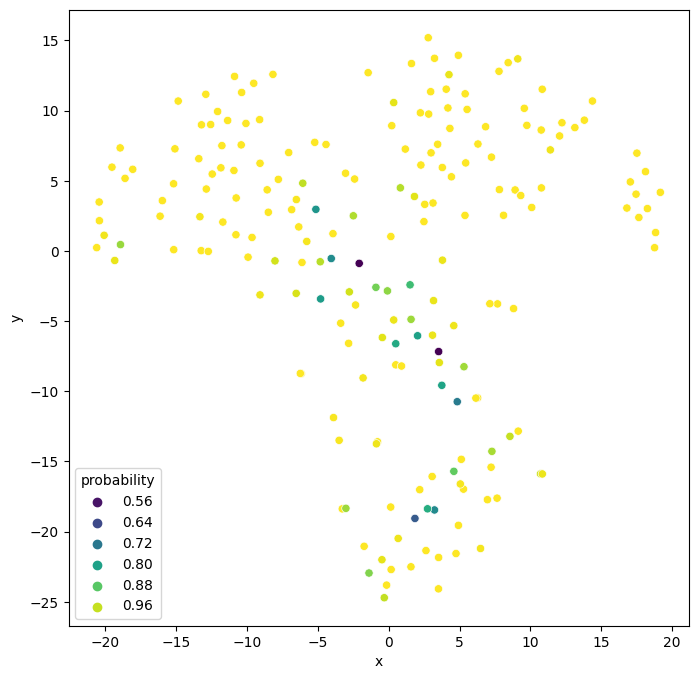

In [8]:
import matplotlib.pyplot as plt
from seaborn import scatterplot

test_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
test_df[['x', 'y']] = test_reducer.fit_transform(X=test_df['value'].apply(func=pd.Series))

fig, ax = plt.subplots(figsize=(8, 8))
plot_df = test_df[['x', 'y']].copy()
plot_df['probability'] = np.max(logreg.predict_proba(X=test_df['value'].apply(func=pd.Series)), axis=1)
scatterplot(ax=ax, data=plot_df, x='x', y='y', hue='probability', palette='viridis')

What do we see? Our model probabilities are generally high, and as per usual the hard cases are mostly along the interface of our TSNE clusters.